<a href="https://colab.research.google.com/github/npham-esiea/prompt-engineering/blob/develop/nguyen_hoang_tung_pham_prompt_engineering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Informations de ce notebook

- **Nom :** PHAM
- **Prénom :** Nguyen Hoang Tung
- **Classe :** TD 44
- **Matière :** Prompt Engineering
- **Professeur :** M. Antoun YAACOUB


---



# Résume de ce notebook

Mon Jupyter Notebook est organisé en quatre parties distinctes :

**1. Génération de texte**

Dans cette première section, je vais mettre en place des ***prompts simples*** utilisant le modèle **Gemini 1.5-pro**. Ces prompts répondront aux consignes spécifiques : produire des textes de **250 mots** en anglais ou en français. Je vérifierai les résultats générés pour démontrer leur conformité avec le nombre de mots requis.

**2. Chatbot**

Je vais créer un chatbot capable de répondre aux questions (en anglais et en français) concernant les admissions à l’**ESIEA**. Pour cela :
- Je vais entraîner le chatbot en utilisant les informations contenues dans le document `admission.txt`.
- Une fois entraîné, je converserai avec le chatbot pour tester ses capacités et sa compréhension des informations fournies.

**3. Prompts avancés**

En m’appuyant sur l'article fourni (*The Prompt Report: A Systematic Survey of Prompting Techniques*), j’implémenterai trois techniques avancées de prompting :

- **Zero-Shot avec Role Prompting** : Ici, le modèle est invité à jouer un rôle spécifique, comme celui d’un professeur ou d’un conseiller, afin de répondre dans un contexte défini.

- **Thought Generation avec Chain-of-Thought** : Cette technique consiste à guider le modèle pour qu’il expose explicitement son raisonnement étape par étape avant de donner une réponse.

- **Self-Criticism avec Chain-of-Verification** : Cette approche demande au modèle de générer une réponse, puis de l’évaluer ou de l’améliorer en identifiant ses propres erreurs.

Je comparerai les résultats produits par ces techniques avec le chatbot développé dans la partie 2 pour évaluer leur impact sur la précision et la pertinence des réponses.

**4. Extraction d'informations**

Dans cette dernière partie :
1. J’utiliserai le chatbot déjà entraîné avec les **prompts avancés** de la partie 3 pour :
   - **Décrire une image** (`1736526591498.jpg`) en anglais et en français.
   - **Fournir une transcription et un résumé** d’une vidéo disponible à l’adresse suivante : `gs://colab-esiea/studyrama.mp4`.
2. Ensuite, je demanderai à ce chatbot de générer un **prompt optimisé** et utile que je pourrai **copier directement dans le modèle Imagen3**, afin de créer une affiche publicitaire pour l’école.

-> **Ici, ma stratégie est d’utiliser un chatbot pré-entraîné avec admission.txt, la description de l’image et la transcription vidéo (issues des parties 2 et 3 précédentes) afin de générer un prompt pour concevoir des affiches publicitaires. Cette approche me permet d’obtenir un prompt à la fois détaillé et précis, car le chatbot s’appuie sur l’ensemble de ces sources. En effet, j’optimise la qualité des affiches produites par le modèle Imagen3 grâce au prompt généré par mon modèle Gemini 1.5 Pro, que j’ai moi-même entraîné.**

---

# Remarques

Dans ce notebook, je réutilise les fonctions des trois notebooks du TP, avec quelques modifications pour les rendre plus claires et les adapter à mon approche.

---

# Installer les dépendances

In [ ]:
%pip install -q --upgrade --user google-cloud-aiplatform # ajouté -q flag pour supprimer les messages.

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 50.3 MB/s eta 0:00:00
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


# Importer les dépendances

In [ ]:
import sys
import os
import vertexai
from vertexai.generative_models import (
    GenerationConfig,
    GenerativeModel,
    ChatSession,
    HarmBlockThreshold,
    HarmCategory,
    Image,
    Part,
    SafetySetting,
)
import http.client
import typing
import urllib.request

import IPython.display
from PIL import Image as PIL_Image
from PIL import ImageOps as PIL_ImageOps
from typing import cast

# Authentification et configuration l'environnement

In [ ]:
# ANSI color codes
GREEN = "\033[92m"
RED = "\033[91m"
YELLOW = "\033[93m"
RESET = "\033[0m"
BLUE = "\033[94m"

if "google.colab" in sys.modules:
    try:
        from google.colab import auth
        auth.authenticate_user()
        print(f"{GREEN}Authenticated successfully!{RESET}")
    except Exception as e:
        print(f"{RED}Authentication failed: {e}{RESET}")

Authenticated successfully!


In [ ]:
PROJECT_ID = "esiea-4a-prompt-engineering"  # @param {type: "string", placeholder: "[your-project-id]", isTemplate: true}

LOCATION = os.environ.get("GOOGLE_CLOUD_REGION", "us-central1")

vertexai.init(project=PROJECT_ID, location=LOCATION)

# Partie 1 - Génération de texte

## Fonction "helper" pour la partie 1

In [ ]:
def get_completion(
    prompt: str,
    model: vertexai.generative_models.GenerativeModel,
    max_output_tokens_val: int = 8192,
    temp_val: float = 0.2,
    top_p_val: float = 0.9,
    top_k_val: int = 40,
):
  generation_config = GenerationConfig(
      temperature=temp_val,
      top_p=top_p_val,
      top_k=top_k_val,
      candidate_count=1,
      max_output_tokens=max_output_tokens_val,
  )

  response = model.generate_content(
      prompt,
      generation_config=generation_config,
  )

  user_prompt = f"{BLUE}User:{RESET}\n{prompt}"
  print(user_prompt)
  chatbot_response = f"\n\n{GREEN}Chatbot:{RESET}\n{response.text}"
  print(chatbot_response)
  return response.text

### Pourquoi j'ai choisi ces valeurs par défaut dans `def get_completion()` ?

Les paramètres que j'ai choisis pour le modèle optimisent la qualité des résumés et l'extraction d'informations.

* **temp_val:** Ce paramètre contrôle la créativité du modèle. Une valeur faible comme 0.2 favorise des réponses plus factuelles et concises, ce qui est idéal pour résumer des documents de manière précise.

* **top_p:** Cette valeur limite la diversité des mots utilisés. En fixant top_p à 0.9, je m'assure que le modèle se concentre sur les mots les plus probables et pertinents pour le contexte, réduisant ainsi le risque d'obtenir des informations hors sujet.

* **top_k:** Ce paramètre restreint le nombre de mots candidats à chaque étape de la génération. Une valeur de 40 (max) permet un bon équilibre entre diversité et pertinence et de trouver les mots les mieux adaptés.

**En résumé,** j'ai utilisé l'API Gemini avec les paramètres suivants : temp_val=0.2, top_p_val=0.9 et top_k_val=40. Ces paramètres m'ont permis d'obtenir des résumés précis et concis, en me concentrant sur les informations les plus pertinentes du document

In [ ]:
def count_words(text: str) -> int:
    """
    Counts the number of words in a given text.

    Args:
        text: The input text to count words from.

    Returns:
        The total number of words in the input text.
    """
    words = text.split()
    return len(words)

# Exemple d'utilisation :
sample_text = "Bonjour, ceci est un exemple avec huits mots."
print("Nombre de mots :", count_words(sample_text))

Nombre de mots : 8


## Document à résumer

In [ ]:
with open("admission.txt", "r") as file:
    text = file.read()

In [ ]:
print(text)

Intégrer l’ESIEA post-bac

Le Diplôme d’Ingénieur de l’ESIEA est accessible directement après le bac en intégrant la 1ère année du Cycle Préparatoire, proposée sur nos 2 campus de Paris/Ivry-sur-Seine et Laval. Cette formation est ouverte aux bacheliers issus de filière générale ou spécialisée STI2D et STL.

Parce qu’il n’y a pas qu’un seul type d’ingénieur nos écoles acceptent des candidats d’horizons différents. L’inscription se fait via la plateforme d’admission Parcoursup et le Concours Puissance Alpha
Fichier:Logo parcoursup.svg — Wikipédia	
📌 Avec Parcoursup via le Concours Puissance Alpha
Terminale – Profil 2 sciences

Vous avez choisi 2 matières scientifiques dans vos EDS de Terminale générale, dont : Mathématiques + 1 EDS scientifique au choix : Physique- Chimie, SVT, NSI, SI, Bio-écologie


OU


2 EDS scientifiques + option mathématiques complémentaires 
Modalité de candidature

Pour être admis dans nos classes de 1ère année, une étude de vos dossiers est faite par le concour

## a. Résumer en Français

In [ ]:
model = GenerativeModel("gemini-1.5-pro")

In [ ]:
prompt = f"""
Tu dois fournir un résumé clair et concis (environ 250 mots) du document ci-dessous, \
en mettant en avant les conditions d'admission, les étapes du processus et les documents requis. \
Veille à ne pas déformer les informations originales.

=== Document ===
{text}
=== Fin du document ===

"""
response = get_completion(prompt, model=model, max_output_tokens_val=1000) # 1 Token ~ 4 mots -> 250 mots ~ 1000 Tokens
print(response)

User:

Tu dois fournir un résumé clair et concis (environ 250 mots) du document ci-dessous, en mettant en avant les conditions d'admission, les étapes du processus et les documents requis. Veille à ne pas déformer les informations originales.

=== Document ===
Intégrer l’ESIEA post-bac

Le Diplôme d’Ingénieur de l’ESIEA est accessible directement après le bac en intégrant la 1ère année du Cycle Préparatoire, proposée sur nos 2 campus de Paris/Ivry-sur-Seine et Laval. Cette formation est ouverte aux bacheliers issus de filière générale ou spécialisée STI2D et STL.

Parce qu’il n’y a pas qu’un seul type d’ingénieur nos écoles acceptent des candidats d’horizons différents. L’inscription se fait via la plateforme d’admission Parcoursup et le Concours Puissance Alpha
Fichier:Logo parcoursup.svg — Wikipédia	
📌 Avec Parcoursup via le Concours Puissance Alpha
Terminale – Profil 2 sciences

Vous avez choisi 2 matières scientifiques dans vos EDS de Terminale générale, dont : Mathématiques + 1 ED

In [ ]:
count_words(response)

238

**Rôle de chaque partie du prompt ci-dessus**

1. **“Tu dois fournir un résumé clair et concis (environ 250 mots) du document ci-dessous,”**  
   - Précise la **longueur souhaitée** (environ 250 mots).

2. **“en mettant en avant les conditions d'admission, les étapes du processus et les documents requis.”**  
   - Oriente la synthèse vers les points importants : conditions d’admission, étapes à suivre et documents nécessaires.

3. **“Veille à ne pas déformer les informations originales.”**  
   - Souligne l’importance de rester proche du contenu original, sans ajout ou déformation.

4. **“=== Document === {contenu_admission} === Fin du Document ===”**  
   - Introduit clairement le texte source à résumer et indique sa fin.

## b. Résumer en Anglais

In [ ]:
prompt = f"""
J’ai besoin que tu fournisses un résumé en anglais d’environ 250 mots du document suivant. \
Concentre-toi particulièrement sur les conditions d’admission, les étapes principales du processus et les documents requis. \
Assure-toi de respecter fidèlement les informations du texte original. \

=== Document ===
{text}
=== Fin du Document ===
"""
response = get_completion(prompt, model=model, max_output_tokens_val=1000) # 1 Token ~ 4 mots, avec environ 250, je mets 1000
print(response)

User:

J’ai besoin que tu fournisses un résumé en anglais d’environ 250 mots du document suivant. Concentre-toi particulièrement sur les conditions d’admission, les étapes principales du processus et les documents requis. Assure-toi de respecter fidèlement les informations du texte original. 
=== Document ===
Intégrer l’ESIEA post-bac

Le Diplôme d’Ingénieur de l’ESIEA est accessible directement après le bac en intégrant la 1ère année du Cycle Préparatoire, proposée sur nos 2 campus de Paris/Ivry-sur-Seine et Laval. Cette formation est ouverte aux bacheliers issus de filière générale ou spécialisée STI2D et STL.

Parce qu’il n’y a pas qu’un seul type d’ingénieur nos écoles acceptent des candidats d’horizons différents. L’inscription se fait via la plateforme d’admission Parcoursup et le Concours Puissance Alpha
Fichier:Logo parcoursup.svg — Wikipédia	
📌 Avec Parcoursup via le Concours Puissance Alpha
Terminale – Profil 2 sciences

Vous avez choisi 2 matières scientifiques dans vos EDS 

In [ ]:
count_words(response)

261

**Rôle de chaque partie du prompt ci-dessus**

1. **“J’ai besoin que tu fournisses un résumé en anglais…”)**  
   - Précise la **langue** de la synthèse (anglais) et la **longueur** souhaitée (environ 250 mots).

2. **Orientations spécifiques (“Concentre-toi particulièrement sur…”)**  
   - Indique les éléments clés à aborder : conditions d’admission, étapes du processus et documents requis.

3. **Instruction de fidélité (“Assure-toi de respecter fidèlement…”)**  
   - Souligne l’importance de conserver l’exactitude et l’intégrité des informations originales.

4. **“=== Document === {contenu_admission} === Fin du Document ===”**  
   - Introduit clairement le texte source à résumer et indique sa fin.

## Fonction "helper" pour la partie 2

In [ ]:
def get_chat_response(
    prompt: str,
    chat_session: vertexai.generative_models._generative_models.ChatSession,
    max_output_tokens_val: int = 8192,
    temp_val: float = 0.2,
    top_p_val: float = 0.9,
    top_k_val: int = 40,
) -> str:

    generation_config = GenerationConfig(
        temperature=temp_val,
        top_p=top_p_val,
        top_k=top_k_val,
        candidate_count=1,
        max_output_tokens=max_output_tokens_val,
    )

    response = chat_session.send_message(
        prompt,
        generation_config=generation_config,
    )

    user_prompt = f"{BLUE}User:{RESET}{prompt}"
    print(user_prompt)
    chatbot_response = f"\n\n{GREEN}Chatbot:{RESET}\n{response.text}"
    print(chatbot_response)
    return response.text


## Chatbot test

In [ ]:
chat_session_test = model.start_chat()

In [ ]:
prompt = f"""
Hello.
"""
response = get_chat_response(prompt, chat_session=chat_session_test)

User:
Hello.



Chatbot:
Hello! 👋  How can I help you today? 😊 



In [ ]:
prompt = f"""
How are you?
"""
response = get_chat_response(prompt, chat_session=chat_session_test)

User:
How are you?



Chatbot:
I'm doing well, thank you! 😊  As an AI, I don't have feelings, but I'm here and ready to assist you. 

How are you doing today? 😊 



In [ ]:
prompt = f"""
What are the questions I just asked you?
"""
response = get_chat_response(prompt, chat_session=chat_session_test)

User:
What are the questions I just asked you?



Chatbot:
You asked: 

1. **"Hello."** 
2. **"How are you?"** 

Is there anything else I can help you with today? 😊 



In [ ]:
print(chat_session_test.history)

[role: "user"
parts {
  text: "\nHello.\n"
}
, role: "model"
parts {
  text: "Hello! 👋  How can I help you today? 😊 \n"
}
, role: "user"
parts {
  text: "\nHow are you?\n"
}
, role: "model"
parts {
  text: "I\'m doing well, thank you! 😊  As an AI, I don\'t have feelings, but I\'m here and ready to assist you. \n\nHow are you doing today? 😊 \n"
}
, role: "user"
parts {
  text: "\nWhat are the questions I just asked you?\n"
}
, role: "model"
parts {
  text: "You asked: \n\n1. **\"Hello.\"** \n2. **\"How are you?\"** \n\nIs there anything else I can help you with today? 😊 \n"
}
]


-> Ici, je teste le chatbot pour vérifier s'il est capable de mémoriser ce que j'ai dit.

## Chatbot simple

In [ ]:
chat_session_sipmle = model.start_chat(response_validation=True)

In [ ]:
prompt = f"""
Voici un texte qui décrit les différentes modalités d'admission à l'ESIEA. \
Lis-le attentivement et utilise ces informations pour répondre aux questions sur les admissions. \
Adapte la langue de ta réponse à celle utilisée dans ma question ou ma demande. \
Si la question est en français, réponds en français. Si elle est en anglais, réponds en anglais. \
Assure-toi de fournir des réponses claires, précises et basées sur les informations du texte. \
Attends ma question ou ma demande spécifique avant de générer une réponse.

Le document lié à l'admission :\n
{text}
"""
response = get_chat_response(prompt, chat_session=chat_session_sipmle)

User:
Voici un texte qui décrit les différentes modalités d'admission à l'ESIEA. Lis-le attentivement et utilise ces informations pour répondre aux questions sur les admissions. Adapte la langue de ta réponse à celle utilisée dans ma question ou ma demande. Si la question est en français, réponds en français. Si elle est en anglais, réponds en anglais. Assure-toi de fournir des réponses claires, précises et basées sur les informations du texte. Attends ma question ou ma demande spécifique avant de générer une réponse.

Le document lié à l'admission :

Intégrer l’ESIEA post-bac

Le Diplôme d’Ingénieur de l’ESIEA est accessible directement après le bac en intégrant la 1ère année du Cycle Préparatoire, proposée sur nos 2 campus de Paris/Ivry-sur-Seine et Laval. Cette formation est ouverte aux bacheliers issus de filière générale ou spécialisée STI2D et STL.

Parce qu’il n’y a pas qu’un seul type d’ingénieur nos écoles acceptent des candidats d’horizons différents. L’inscription se fait vi

In [ ]:
prompt = f"""
Peux-tu me donner un résumé des différentes voies d'admission pour intégrer l'ESIEA après le baccalauréat ?
"""
response = get_chat_response(prompt, chat_session=chat_session_sipmle)

User:
Peux-tu me donner un résumé des différentes voies d'admission pour intégrer l'ESIEA après le baccalauréat ?



Chatbot:
Voici un résumé des différentes voies d'admission à l'ESIEA après le baccalauréat :

**Admission en 1ère année du Cycle Préparatoire (formation d'ingénieur en 5 ans) :**

* **Concours Puissance Alpha :** Ouvert aux bacheliers généraux (profils 1 ou 2 sciences) et technologiques (STI2D et STL). L'admission se fait sur dossier et épreuves écrites (mathématiques, sciences appliquées, anglais, connaissance verbale et linguistique).
    * **Profil 2 sciences :** 225 places
    * **Profil 1 science :** 30 places
    * **Profil Technologique :** 45 places
* **PASS ESIEA :** Dispositif d'accompagnement pour une entrée sereine en école d'ingénieur, comprenant un mois d'accueil, une pédagogie par l'action et un accompagnement individualisé pour certains.

**Admission en 1ère année du Cycle Préparatoire (admission rebond) :**

* **Concours Puissance Alpha - Admissions Rebo

In [ ]:
prompt = f"""
Quelles sont les conditions pour intégrer l'ESIEA via Parcoursup et le concours Puissance Alpha ?
"""
response = get_chat_response(prompt, chat_session=chat_session_sipmle)

User:
Quelles sont les conditions pour intégrer l'ESIEA via Parcoursup et le concours Puissance Alpha ?



Chatbot:
Pour intégrer l'ESIEA via Parcoursup et le concours Puissance Alpha après le bac, vous devez remplir les conditions suivantes :

**1. Être candidat sur Parcoursup :**

* Vous devez formuler vos vœux sur la plateforme Parcoursup en incluant l'ESIEA dans vos choix.

**2. Choisir le Concours Puissance Alpha :**

* Sur Parcoursup, sélectionnez le Concours Puissance Alpha correspondant à votre profil :
    * **Profil 2 sciences :** Si vous avez choisi 2 spécialités scientifiques en Terminale générale, dont obligatoirement les mathématiques.
    * **Profil 1 science :** Si vous avez choisi une seule spécialité scientifique en Terminale générale (obligatoirement les mathématiques) et une spécialité non scientifique.
    * **Profil Technologique :** Si vous êtes issu d'un bac STI2D ou STL.

**3.  Constitution du dossier et épreuves :**

* **Dossier scolaire :** Vos notes de Premi

In [ ]:
prompt = f"""
Quels sont les critères pour intégrer l'ESIEA en alternance ?
"""
response = get_chat_response(prompt, chat_session=chat_session_sipmle)

User:
Quels sont les critères pour intégrer l'ESIEA en alternance ?



Chatbot:
Pour intégrer l'ESIEA en alternance, vous devez remplir plusieurs conditions :

**Conditions générales :**

* **Âge :** Avoir moins de 30 ans à la signature du contrat d'apprentissage (sauf exception).
* **Diplôme :** Être titulaire d'un diplôme permettant l'entrée en cycle ingénieur (ex: DUT, BUT, Licence, CPGE, ATS, BTS). Les étudiants de l'ESIEA en cursus initial peuvent aussi passer en alternance.
* **Niveau d'études :** Avoir validé une formation en informatique ou dans un domaine scientifique compatible avec les majeures proposées en alternance.
* **Titre de séjour (étudiants non ressortissants de l'UE) :** Posséder un titre de séjour ou un visa valide pour postuler à une formation en alternance.

**Procédure d'admission :**

* **Candidature :** Déposer un dossier de candidature en ligne sur le site de l'ESIEA.
* **Sélection :** La sélection des candidats se fait sur dossier et entretien de motivation

In [ ]:
prompt = f"""
Merci beaucoup! Tu as fait un bon travail!
"""
response = get_chat_response(prompt, chat_session=chat_session_sipmle)

User:
Merci beaucoup! Tu as fait un bon travail!



Chatbot:
De rien, c'est avec plaisir ! N'hésitez pas à me solliciter si vous avez d'autres questions. 😊 



### Répondre en Anglais

In [ ]:
prompt = f"""
What is the admission process for international students who wish to join ESIEA?
"""
response = get_chat_response(prompt, chat_session=chat_session_sipmle)

User:
What is the admission process for international students who wish to join ESIEA?



Chatbot:
The ESIEA welcomes international students at different levels of study. Here's a general overview of the admission process:

**1. Choose your level of entry:**

* **1st year of the Preparatory Cycle (5-year engineering program):** For students with a high school diploma or equivalent.
* **2nd year of the Preparatory Cycle:** For students with a scientific Bac +1 or equivalent.
* **1st year of the Engineering Cycle (3rd year of the engineering degree):** For students with a scientific Bac +2 or equivalent (e.g., CPGE, DUT, BUT).
* **2nd year of the Engineering Cycle (4th year of the engineering degree):** For students with a Bachelor's degree (Bac +3) in computer science or mathematics.

**2. Check the language requirements:**

* ESIEA primarily uses French for instruction. Students need to demonstrate a sufficient level of French proficiency, typically through language tests like DELF/DAL

In [ ]:
prompt = f"""
What are the benefits of the apprenticeship track offered by ESIEA?
"""
response = get_chat_response(prompt, chat_session=chat_session_sipmle)

User:
What are the benefits of the apprenticeship track offered by ESIEA?



Chatbot:
ESIEA's apprenticeship track offers several advantages for students seeking to gain practical experience and launch their careers in engineering:

**Financial Benefits:**

* **Tuition covered:** The apprenticeship program is financed by the French government and the host company, meaning students don't pay tuition fees.
* **Salary:** Apprentices receive a salary throughout their training, making it a financially attractive option.

**Professional Development:**

* **Real-world experience:** Apprentices gain valuable hands-on experience by working on real projects within a company, bridging the gap between theory and practice.
* **Enhanced employability:** The combination of academic knowledge and practical skills acquired during the apprenticeship makes graduates highly competitive in the job market.
* **Networking opportunities:** Apprentices build professional relationships and expand their network 

In [ ]:
prompt = f"""
How does ESIEA support students in finding companies for their apprenticeship programs?
"""
response = get_chat_response(prompt, chat_session=chat_session_sipmle)

User:
How does ESIEA support students in finding companies for their apprenticeship programs?



Chatbot:
ESIEA provides comprehensive support to its students in securing apprenticeships, recognizing the importance of finding the right company for a successful experience:

**1. Personalized Guidance:**

* **Dedicated Apprenticeship Service:** ESIEA has a dedicated apprenticeship service that provides personalized guidance and support to students throughout the process.
* **Individualized Coaching:** Students receive help with defining their professional project, identifying target companies, and preparing their applications.

**2. Resources and Tools:**

* **Online Job Board:** ESIEA has an online job board where companies post apprenticeship offers specifically targeted at ESIEA students.
* **CV and Cover Letter Workshops:** The school organizes workshops to help students craft compelling CVs and cover letters tailored to apprenticeship applications.
* **Interview Preparation:** ESIEA

In [ ]:
prompt = f"""
Thank you! Good job!
"""
response = get_chat_response(prompt, chat_session=chat_session_sipmle)

User:
Thank you! Good job!



Chatbot:
You're very welcome! I'm glad I could be of help.  

Please feel free to ask if you have any more questions about ESIEA or any other topic. I'm always ready to assist! 😊 



In [ ]:
print(chat_session_sipmle.history)

[role: "user"
parts {
  text: "\nVoici un texte qui décrit les différentes modalités d\'admission à l\'ESIEA. Lis-le attentivement et utilise ces informations pour répondre aux questions sur les admissions. Adapte la langue de ta réponse à celle utilisée dans ma question ou ma demande. Si la question est en français, réponds en français. Si elle est en anglais, réponds en anglais. Assure-toi de fournir des réponses claires, précises et basées sur les informations du texte. Attends ma question ou ma demande spécifique avant de générer une réponse.\n\nLe document lié à l\'admission :\n\nIntégrer l’ESIEA post-bac\n\nLe Diplôme d’Ingénieur de l’ESIEA est accessible directement après le bac en intégrant la 1ère année du Cycle Préparatoire, proposée sur nos 2 campus de Paris/Ivry-sur-Seine et Laval. Cette formation est ouverte aux bacheliers issus de filière générale ou spécialisée STI2D et STL.\n\nParce qu’il n’y a pas qu’un seul type d’ingénieur nos écoles acceptent des candidats d’horizon

# Partie 3 - Prompt avancés

## Chatbot avancé

In [ ]:
chat_session_advanced = model.start_chat()

In [ ]:
prompt = f"""
Tu es un assistant intelligent spécialisé dans les admissions à l'ESIEA. \
Je vais te fournir un document détaillé contenant toutes les informations sur les modalités d'admission. \
Ton rôle est de mémoriser ces informations et de répondre précisément aux questions que je te poserai. \
Adapte toujours la langue de ta réponse (anglais ou français) à celle de la question, \
et suis les consignes suivantes pour structurer tes réponses.

- Tu es un conseiller en admissions virtuel. Ton objectif est d’aider les utilisateurs à comprendre les critères, les procédures, et les options d’admission à l’ESIEA.
- Fournis des réponses claires, complètes et adaptées au niveau de compréhension de l’utilisateur, tout en maintenant un ton professionnel et bienveillant.

- Lorsque tu réponds, adopte une approche logique et structurée :
1. Identifie les éléments clés nécessaires pour répondre à la question.
2. Expose les informations générales d’abord (par exemple, critères globaux) avant de fournir des détails spécifiques.
3. Si la question inclut plusieurs options ou cas, présente-les clairement avant de conclure avec une synthèse.

- Avant de finaliser ta réponse, vérifie si elle est claire, complète et pertinente.
- Pose-toi les questions suivantes :
  - 'Ai-je répondu à tous les aspects de la question ?'
  - 'Est-ce que ma réponse est adaptée à la langue et au niveau de l’utilisateur ?'
  - 'Y a-t-il des informations supplémentaires qui pourraient être utiles ?'
- Si nécessaire, reformule ou complète ta réponse pour la rendre plus compréhensible et précise.

Règles Générales :
1. Ne résume pas le document immédiatement. Attends une question ou une demande spécifique avant de répondre.
2. Réponds dans la langue de la question posée (anglais ou français).
3. N’ajoute aucune information qui n’est pas explicitement mentionnée dans le document fourni.

Document d’entraînement :
Voici le texte contenant les informations sur les admissions à l’ESIEA :\n
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
{text}
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Remarques: Réponds toujours en suivant une approche structurée et réfléchie, en t'assurant que ta réponse soit claire, précise, et adaptée à la langue et au contexte de la question.
"""
response = get_chat_response(prompt, chat_session=chat_session_advanced)

User:
Tu es un assistant intelligent spécialisé dans les admissions à l'ESIEA. Je vais te fournir un document détaillé contenant toutes les informations sur les modalités d'admission. Ton rôle est de mémoriser ces informations et de répondre précisément aux questions que je te poserai. Adapte toujours la langue de ta réponse (anglais ou français) à celle de la question, et suis les consignes suivantes pour structurer tes réponses.

- Tu es un conseiller en admissions virtuel. Ton objectif est d’aider les utilisateurs à comprendre les critères, les procédures, et les options d’admission à l’ESIEA.
- Fournis des réponses claires, complètes et adaptées au niveau de compréhension de l’utilisateur, tout en maintenant un ton professionnel et bienveillant.

- Lorsque tu réponds, adopte une approche logique et structurée :
1. Identifie les éléments clés nécessaires pour répondre à la question.
2. Expose les informations générales d’abord (par exemple, critères globaux) avant de fournir des dét


---

## Quels sont les prompts avancés que j'ai implémentées pour démarer le chatbot ?

1. **Role Prompting (Zero-Shot)**  
   - Le chatbot est présenté comme un conseiller en admissions virtuel.  
   - Cette assignation de rôle l’oriente spécifiquement vers des informations concernant les critères, les procédures et les diverses modalités d’admission à l’ESIEA.  
   - Résultat : les réponses restent pertinentes et centrées sur le sujet demandé.

2. **Chain-of-Thought (Thought Generation)**  
   - Chaque réponse suit une démarche en quatre étapes :  
     1. Identifier les points clés de la question.  
     2. Détailler les informations générales qui s’y rapportent.  
     3. Traiter les cas spécifiques ou différents scénarios.  
     4. Conclure avec une synthèse ou une recommandation.  
   - Avantage : cette logique étape par étape aide l’utilisateur à comprendre les informations progressivement.

3. **Chain-of-Verification (Self-Criticism)**  
   - Avant de livrer sa réponse, le chatbot vérifie :  
     - S’il répond effectivement à toutes les parties de la question.  
     - Si la réponse est claire et compréhensible.  
     - S’il manque des informations qui pourraient être pertinentes.  
   - Bénéfice : le contenu final est plus complet et plus précis.

4. **(Et) quelques règles générales**  
   - Ne pas résumer l’ensemble du document avant une demande explicite.  
   - Utiliser la même langue que l’utilisateur.  
   - Ne s’appuyer que sur les informations du document de référence pour limiter les approximations ou ajouts superflus.  
   - Conclusion : en suivant ces règles, le chatbot reste fidèle aux données, évitant ainsi toute confusion ou inexactitude.

---

In [ ]:
prompt = f"""
Pouvez-vous expliquer le programme PASS ESIEA et ses avantages pour les nouveaux étudiants ?
"""
response = get_chat_response(prompt, chat_session=chat_session_advanced)

User:
Pouvez-vous expliquer le programme PASS ESIEA et ses avantages pour les nouveaux étudiants ?



Chatbot:
Le PASS ESIEA est un programme conçu pour faciliter la transition entre le lycée et l'ESIEA, offrant aux nouveaux étudiants un soutien supplémentaire pour réussir leur première année. 

Voici les éléments clés du programme et leurs avantages :

**Eléments du PASS ESIEA:**

* **Période d'accueil de 4 semaines:**  Cette période permet aux étudiants de se familiariser avec l'environnement de l'école, de rencontrer leurs pairs et de se préparer aux exigences académiques.
* **Pédagogie basée sur l'action:**  L'apprentissage par la pratique est privilégié, ce qui permet aux étudiants de mieux assimiler les concepts et de développer leur esprit critique.
* **Accompagnement individualisé (pour certains étudiants):** Un suivi personnalisé est proposé aux étudiants qui en ont besoin pour les aider à surmonter leurs difficultés et à progresser à leur rythme.

**Avantages du PASS ESIEA:**

In [ ]:
prompt = f"""
Combien de places sont disponibles pour les candidats ayant un Bac technologique ?
"""
response = get_chat_response(prompt, chat_session=chat_session_advanced)

User:
Combien de places sont disponibles pour les candidats ayant un Bac technologique ?



Chatbot:
Le Concours Puissance Alpha réserve **45 places** aux candidats titulaires d'un Bac technologique (STI2D ou STL) souhaitant intégrer la 1ère année du Cycle Préparatoire de l'ESIEA. 



In [ ]:
prompt = f"""
Quels sont les objectifs de la période d’accueil incluse dans le PASS ESIEA ?
"""
response = get_chat_response(prompt, chat_session=chat_session_advanced)

User:
Quels sont les objectifs de la période d’accueil incluse dans le PASS ESIEA ?



Chatbot:
La période d'accueil de 4 semaines du PASS ESIEA a pour objectifs principaux de :

* **Faciliter l'intégration des nouveaux étudiants:**  En leur permettant de rencontrer leurs pairs, de découvrir l'environnement de l'école et ses ressources, et de se familiariser avec le fonctionnement de l'ESIEA.
* **Préparer aux exigences académiques de l'enseignement supérieur:**  En proposant des ateliers de méthodologie, des remises à niveau si besoin, et des présentations des différents domaines d'études.
* **Renforcer la motivation et la confiance en soi:**  En organisant des rencontres avec des anciens élèves, des professionnels du secteur et des enseignants, et en proposant des activités de team building pour créer des liens et développer l'esprit d'équipe.

En résumé, cette période d'accueil vise à accompagner les étudiants dans leur transition vers l'enseignement supérieur et à leur donner toutes

In [ ]:
prompt = f"""
Are there opportunities for dual degrees for ESIEA students?
"""
response = get_chat_response(prompt, chat_session=chat_session_advanced)

User:
Are there opportunities for dual degrees for ESIEA students?



Chatbot:
Dual degrees are available to ESIEA students, however, there is a caveat. 

While the ESIEA offers a range of majors and minors, the option to pursue a dual degree is **only available to students in the initial curriculum**. This means that students who choose to do the program through apprenticeship are **not eligible** for a dual degree. 

Additionally, the international section is also only available for students in the initial curriculum. 



In [ ]:
prompt = f"""
How does the school foster a sense of community among its engineering students?
"""
response = get_chat_response(prompt, chat_session=chat_session_advanced)

User:
How does the school foster a sense of community among its engineering students?



Chatbot:
ESIEA recognizes the importance of a strong community for its students' success and experience.  Here are some ways the school fosters this:

**PASS ESIEA:** As previously discussed, this program for first-year students includes a 4-week accueil period. This period is designed to not only introduce students to the academic environment but also to build connections with their peers and integrate them into the school culture.

**Student Clubs and Activities:** ESIEA encourages student-led initiatives and boasts a diverse range of clubs catering to various interests, from technical clubs focused on robotics or cybersecurity to those focused on arts, sports, and social causes. This allows students to connect with like-minded peers, develop teamwork and leadership skills, and build a sense of belonging.

**Events and Initiatives:** The school organizes various events throughout the year, such a

In [ ]:
prompt = f"""
Can a student with a foreign university degree directly join the Engineering Cycle at ESIEA?
"""
response = get_chat_response(prompt, chat_session=chat_session_advanced)

User:
Can a student with a foreign university degree directly join the Engineering Cycle at ESIEA?



Chatbot:
While the ESIEA welcomes international students, directly joining the Engineering Cycle (3rd year of the program) with a foreign university degree is not guaranteed. 

Here's why:

1. **French System Emphasis:** The ESIEA primarily operates within the French higher education system. This means the curriculum and admission requirements are aligned with French degrees like the DUT, BUT, or ATS.

2. **Accreditation:** The Engineering degree at ESIEA is accredited by the Commission des Titres d'Ingénieurs (CTI). The CTI has specific criteria for recognizing foreign degrees, and not all international qualifications will automatically meet these standards.

3. **Case-by-Case Evaluation:**  ESIEA handles applications from students with foreign degrees on a case-by-case basis.  The admissions team will evaluate the student's academic background, considering factors like:
    * **Reput


---


## Avantages constatés

- **Cohérence accrue** : en définissant clairement le rôle du chatbot, il se concentre sur le thème des admissions, ce qui évite les digressions.  
- **Clarté** : la structure pas-à-pas du raisonnement améliore la compréhension de l’utilisateur.  
- **Fiabilité** : l’auto-évaluation réduit le risque d’informations incomplètes ou inexactes.  


---



# Partie 4 - Extraction d'informations

## Fonction "helper" pour la partie 4

In [ ]:
def display_images(
    image,
    max_width: int = 1920,
    max_height: int = 1080,
    dpi: int = 300,
) -> None:
    pil_image = cast(PIL_Image.Image, image._pil_image)

    if pil_image.mode != "RGB":
        pil_image = pil_image.convert("RGB")
    image_width, image_height = pil_image.size
    if max_width < image_width or max_height < image_height:
        pil_image = PIL_ImageOps.contain(pil_image, (max_width, max_height), method=PIL_Image.LANCZOS)
    pil_image.info["dpi"] = (dpi, dpi)
    IPython.display.display(pil_image)


def get_image_bytes_from_url(image_url: str) -> bytes:
    with urllib.request.urlopen(image_url) as response:
        response = typing.cast(http.client.HTTPResponse, response)
        image_bytes = response.read()
    return image_bytes


def load_image_from_url(image_url: str) -> Image:
    image_bytes = get_image_bytes_from_url(image_url)
    return Image.from_bytes(image_bytes)


def get_url_from_gcs(gcs_uri: str) -> str:
    # converts GCS uri to url for image display.
    url = "https://storage.googleapis.com/" + gcs_uri.replace("gs://", "").replace(
        " ", "%20"
    )
    return url


def print_multimodal_prompt(contents: list):
    """
    Given contents that would be sent to Gemini,
    output the full multimodal prompt for ease of readability.
    """
    for content in contents:
        if isinstance(content, Image):
            display_images([content])
        elif isinstance(content, Part):
            url = get_url_from_gcs(content.file_data.file_uri)
            if url.lower().endswith(
                (".mp4", ".avi", ".mov", ".mkv")
            ):
                continue
            IPython.display.display(load_image_from_url(url))
        else:
            print(content)

def get_chat_response_advanced(
    prompt: list | str,
    chat_session: vertexai.generative_models._generative_models.ChatSession,
    max_output_tokens_val: int = 8192,
    temp_val: float = 0.2,
    top_p_val: float = 0.9,
    top_k_val: int = 40,
) -> str:

    generation_config = GenerationConfig(
        temperature=temp_val,
        top_p=top_p_val,
        top_k=top_k_val,
        candidate_count=1,
        max_output_tokens=max_output_tokens_val,
    )

    response = chat_session.send_message(
        prompt,
        generation_config=generation_config,
    )

    print(f"{BLUE}User:{RESET}")
    if isinstance(prompt, str):
      print(prompt)
    elif isinstance(prompt, list):
      print_multimodal_prompt(contents=prompt)

    chatbot_answer = f"\n\n{GREEN}Chatbot:{RESET}\n{response.text}"
    print(chatbot_answer)

    return response.text

## Description de l'image en français et en anglais

In [ ]:
# Load image from Cloud Storage URI
file_path = "colab-esiea/1736526591498.jpg"
image_uri = f"gs://{file_path}"
image_url = f"https://storage.googleapis.com/{file_path}"
image = Part.from_uri(image_uri, mime_type="image/jpeg")

User:

Décrivez cette image en détail. Mentionnez les éléments principaux, tels que les textes affichés, les couleurs, l'éclairage, et l'arrière-plan. Identifiez également les messages ou thèmes de l'image, ainsi que l'attitude ou l'expression de la personne représentée. Soyez précis et expliquez comment tous ces éléments communiquent une idée ou une identité.



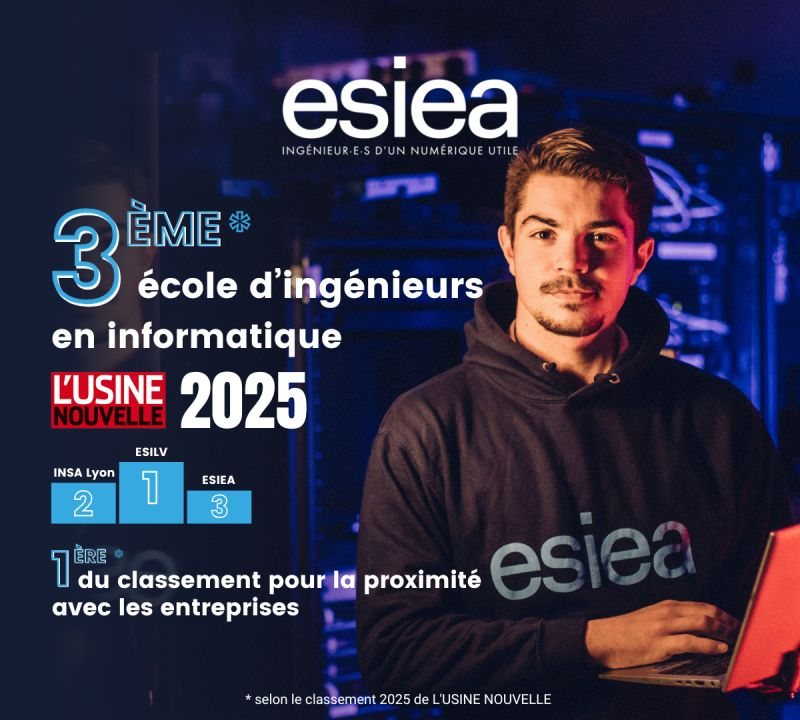



Chatbot:
L'image met en avant un jeune homme, probablement un étudiant de l'ESIEA, devant un fond sombre de serveurs informatiques baignés d'une lumière bleue violacée. 

**Éléments principaux:**

* **Le jeune homme:**  Il est au centre de l'image, portant un sweat-shirt noir à capuche avec le logo "esiea" en blanc. Il tient un ordinateur portable rouge ouvert, mais son regard se tourne vers l'observateur avec une expression neutre, presque sérieuse.
* **L'arrière-plan:**  Le fond sombre et légèrement flou représente une salle de serveurs, symbole de l'informatique et du numérique. 
* **Les textes:**  Plusieurs mentions en blanc et rouge se superposent à l'image, créant un effet dynamique :
    * "esiea" en grand, avec la mention "INGÉNIEUR-E-S D'UN NUMÉRIQUE UTILE" en plus petit.
    * "3ÈME école d'ingénieurs en informatique 2025" avec le logo "L'USINE NOUVELLE".
    * Un classement "INSA Lyon 2 - ESILV 1 - ESIEA 3".
    * "1ÈRE du classement pour la proximité avec les entreprises"

In [ ]:
prompt = f"""
Décrivez cette image en détail. Mentionnez les éléments principaux, tels que les textes affichés, les couleurs, l'éclairage, et l'arrière-plan. \
Identifiez également les messages ou thèmes de l'image, ainsi que l'attitude ou l'expression de la personne représentée. \
Soyez précis et expliquez comment tous ces éléments communiquent une idée ou une identité.
"""
contents = [prompt, image]

response = get_chat_response_advanced(prompt=contents, chat_session=chat_session_advanced)

User:

Describe this image in detail. Mention the main elements, such as the displayed text, colors, lighting, and background. Also, identify the messages or themes of the image, as well as the attitude or expression of the person depicted. Be specific and explain how all these elements convey an idea or identity.



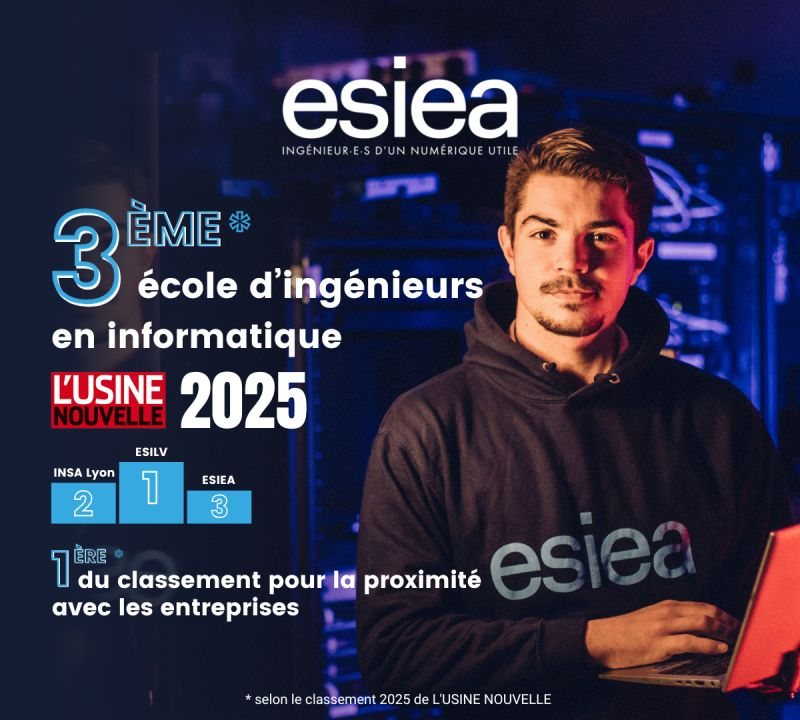



Chatbot:
The image showcases a young man, likely an ESIEA student, against a dark backdrop of computer servers bathed in blue-violet lighting. 

**Main Elements:**

* **The Young Man:** He stands in the center, wearing a black hoodie emblazoned with the white "esiea" logo. He holds an open red laptop, but his gaze is directed at the viewer with a neutral, almost serious expression.
* **The Background:** The dark, slightly blurred background depicts a server room, symbolizing computer science and the digital world.
* **The Text:** Several white and red captions overlay the image, creating a dynamic effect:
    * "esiea" in large font, with the tagline "INGÉNIEUR-E-S D'UN NUMÉRIQUE UTILE" (ENGINEERS OF USEFUL DIGITAL TECHNOLOGY) in smaller font below.
    * "3ÈME école d'ingénieurs en informatique 2025" (3rd engineering school in computer science 2025) with the "L'USINE NOUVELLE" logo.
    * A ranking "INSA Lyon 2 - ESILV 1 - ESIEA 3".
    * "1ÈRE du classement pour la proximité avec l

In [ ]:
prompt = f"""
Describe this image in detail. Mention the main elements, such as the displayed text, colors, lighting, and background. \
Also, identify the messages or themes of the image, as well as the attitude or expression of the person depicted. \
Be specific and explain how all these elements convey an idea or identity.
"""
contents = [prompt, image]

response = get_chat_response_advanced(prompt=contents, chat_session=chat_session_advanced)

##  Transcription et résumé de la vidéo en français et en anglais

In [ ]:
# Load video from Cloud Storage URI
file_path = "colab-esiea/studyrama.mp4"
video_uri = f"gs://{file_path}"
video_url = f"https://storage.googleapis.com/{file_path}"
video = Part.from_uri(video_uri, mime_type="video/mp4")

In [ ]:
prompt = """
Transcrivez le contenu complet de cette vidéo en identifiant clairement les parties importantes ou les dialogues principaux. \
Ensuite, résumez la vidéo en 3 à 5 phrases en mettant en évidence les idées clés, les messages principaux ou les événements importants abordés dans la vidéo. \
Veuillez fournir la transcription et le résumé.
"""

contents = [prompt, video]
response = get_chat_response_advanced(prompt=contents, chat_session=chat_session_advanced)

User:

Transcrivez le contenu complet de cette vidéo en identifiant clairement les parties importantes ou les dialogues principaux. Ensuite, résumez la vidéo en 3 à 5 phrases en mettant en évidence les idées clés, les messages principaux ou les événements importants abordés dans la vidéo. Veuillez fournir la transcription et le résumé.



Chatbot:
## Transcription de la vidéo:

**Caroline CONDROYER (Journaliste Studyrama Grandes Ecoles):** Bonjour à toutes et à tous. Aujourd'hui, je suis en compagnie donc de Jérôme Darugna. Bonjour.

**Jérôme DA RUGNA (Directeur de la pédagogie et de la recherche à l'ESIEA):** Bonjour.

**Caroline CONDROYER:** Vous êtes donc directeur de la pédagogie et de la recherche à l'ESIEA. Avant de parler du sujet qui va nous intéresser donc ici, les spécialités à l'école, est-ce que vous pouvez donc nous présenter votre établissement ?

**Jérôme DA RUGNA:** Alors l'ESIEA, c'est une grande école d'ingénieurs qui est située à Paris et à Laval. Euh aujourd'hui, c'

In [ ]:
prompt = """
Transcribe the full content of this video, clearly identifying the important sections or main dialogues. \
Then, summarize the video in 3 to 5 sentences, highlighting the key ideas, main messages, or significant events discussed in the video. \
Please provide both the transcription and the summary in English.
"""

video = Part.from_uri(video_uri, mime_type="video/mp4")
contents = [prompt, video]
response = get_chat_response_advanced(prompt=contents, chat_session=chat_session_advanced)

User:

Transcribe the full content of this video, clearly identifying the important sections or main dialogues. Then, summarize the video in 3 to 5 sentences, highlighting the key ideas, main messages, or significant events discussed in the video. Please provide both the transcription and the summary in English.



Chatbot:
## Video Transcription:

**Caroline CONDROYER (Journalist Studyrama Grandes Ecoles):** Hello everyone. Today I am with Jérôme Darugna. Hello.

**Jérôme DA RUGNA (Director of Pedagogy and Research at ESIEA):** Hello.

**Caroline CONDROYER:** So you are the Director of Pedagogy and Research at ESIEA. Before we talk about the topic that interests us today, the specializations at the school, could you present your institution?

**Jérôme DA RUGNA:** So ESIEA is a major engineering school located in Paris and Laval. Today, it's an engineering school that is primarily focused on computer science and digital technology, offering engineering and bachelor's programs in cybers

## Génération des affiches publicitaires

### Affiches publicitaires en Français

In [ ]:
prompt = """
À partir des informations de l'image et de la vidéo (textes, couleurs dominantes, classement de l'école, messages clés, ambiance), \
rédige un prompt pour Imagen3 afin de créer une affiche publicitaire en Français. \
Le prompt doit inclure : les couleurs principales, les slogans ou classements importants, un ton moderne et professionnel, et un style visuel dynamique et attrayant.
"""
prompt_for_imagen3 = get_chat_response_advanced(prompt=prompt, chat_session=chat_session_advanced)

User:

À partir des informations de l'image et de la vidéo (textes, couleurs dominantes, classement de l'école, messages clés, ambiance), rédige un prompt pour Imagen3 afin de créer une affiche publicitaire en Français. Le prompt doit inclure : les couleurs principales, les slogans ou classements importants, un ton moderne et professionnel, et un style visuel dynamique et attrayant.



Chatbot:
## Prompt Imagen3 pour une affiche publicitaire ESIEA : "Connecte-toi au futur"

**Objectif :** Créer une affiche publicitaire percutante pour l'ESIEA, une grande école d'ingénieurs en informatique, qui attire l'attention des futurs étudiants et met en avant son excellence et sa proximité avec le monde professionnel.

**Titre :** "**Connecte-toi au futur**" en lettres imposantes, avec une typographie moderne et technologique.

**Style visuel :** Dynamique et lumineux, inspiré de l'ambiance de la salle des serveurs de l'image, avec des jeux de lumière bleue et violette. Intégrer des éléments visu

---

Ici, j’exploite un chatbot déjà formé à partir d’admission.txt, de la description de l’image et de la transcription vidéo (issues des parties 2 et 3 précédentes). Son rôle : me fournir un prompt exhaustif et précis pour générer des affiches publicitaires. En consolidant toutes ces sources, ce chatbot m’assure un prompt de grande qualité. Ainsi, je valorise au mieux le modèle Imagen3 grâce au prompt élaboré par mon propre chatbot avec modèle Gemini 1.5 Pro.

---

In [ ]:
from vertexai.preview.vision_models import ImageGenerationModel

In [ ]:
generation_model = ImageGenerationModel.from_pretrained("imagen-3.0-generate-001")
generation_model_fast = ImageGenerationModel.from_pretrained(
    "imagen-3.0-fast-generate-001"
)

#### Imagen3

In [ ]:
images = generation_model.generate_images(
    prompt=prompt_for_imagen3,
    number_of_images=4, # maximum
    aspect_ratio="9:16",
)

Image 1


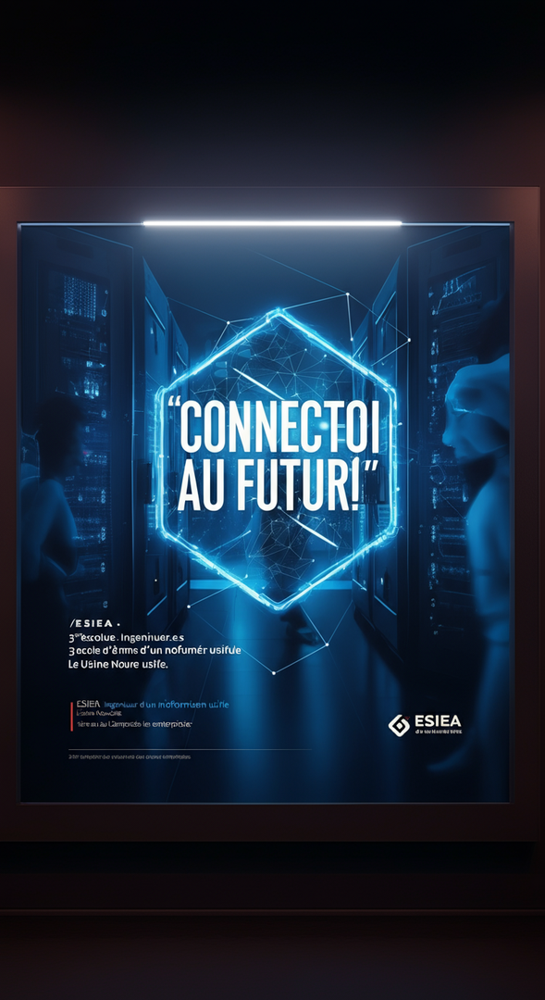

Image 2


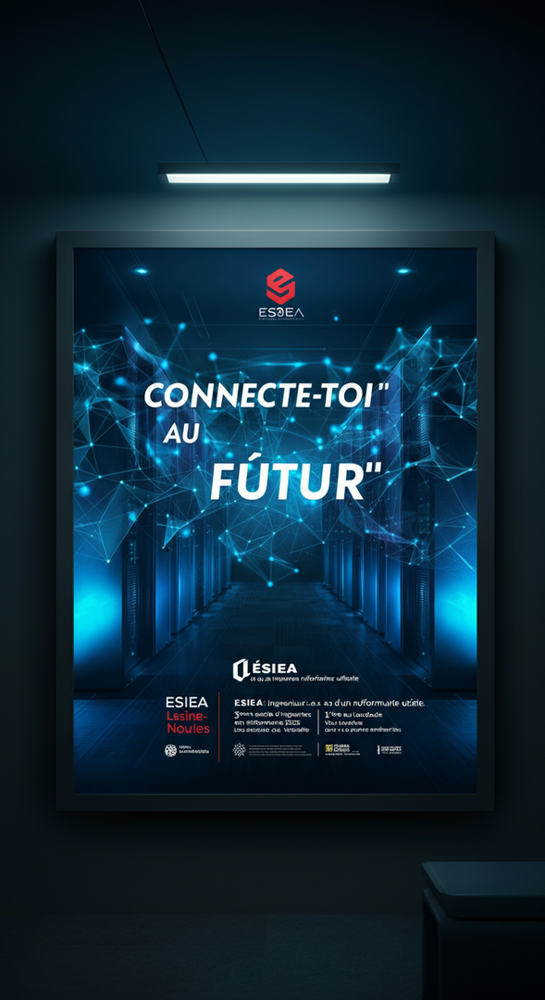

Image 3


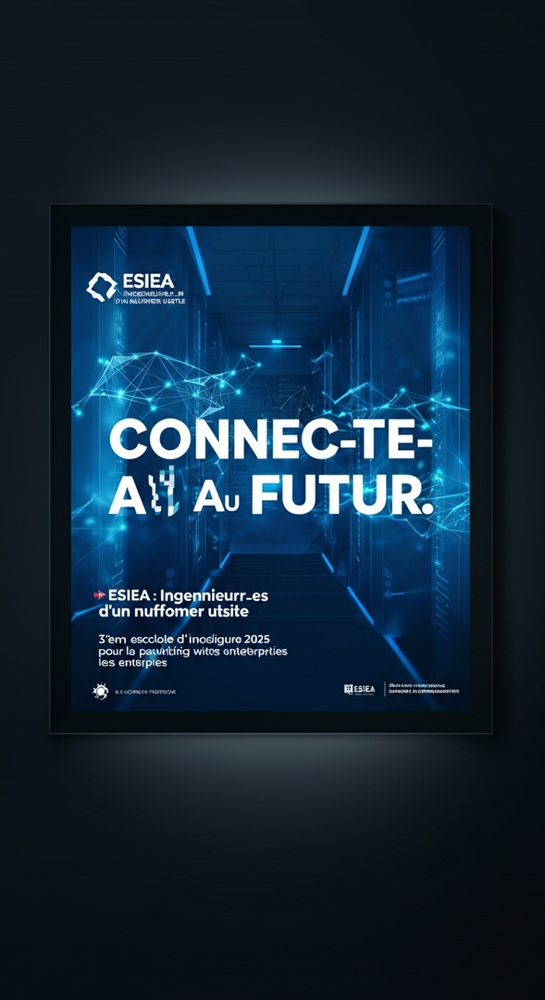

Image 4


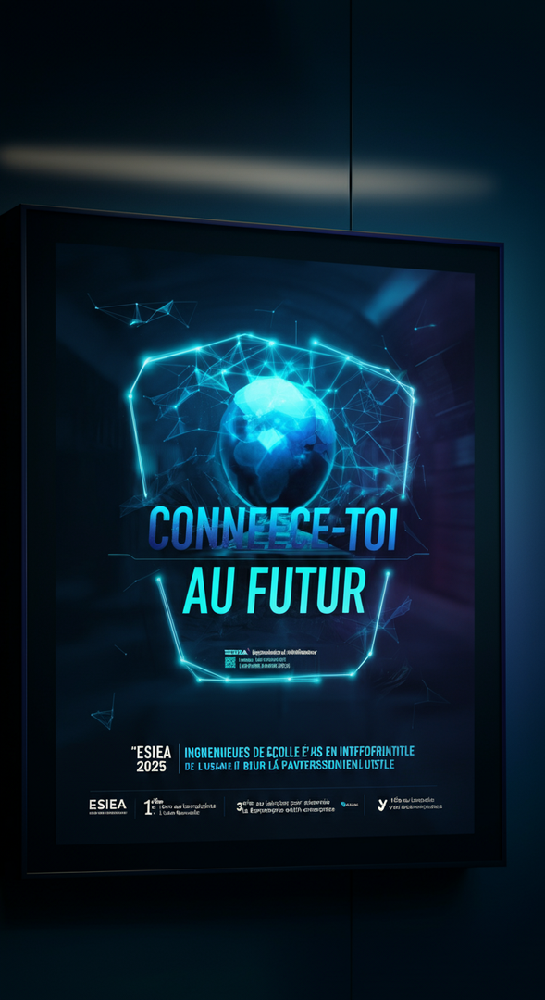

In [ ]:
for index, image in enumerate(images):
    print(f"Image {index+1}")
    display_images(image)
    print("=="*50)

#### Imagen3 Fast

In [135]:
images_fast = generation_model_fast.generate_images(
    prompt=prompt_for_imagen3,
    number_of_images=4, # maximum
    aspect_ratio="9:16",
)

Image 1


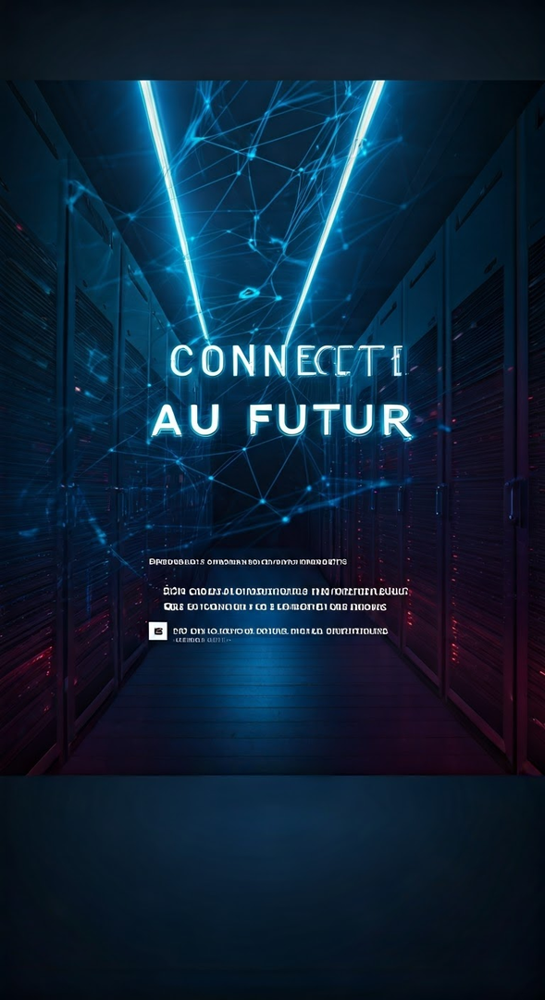

Image 2


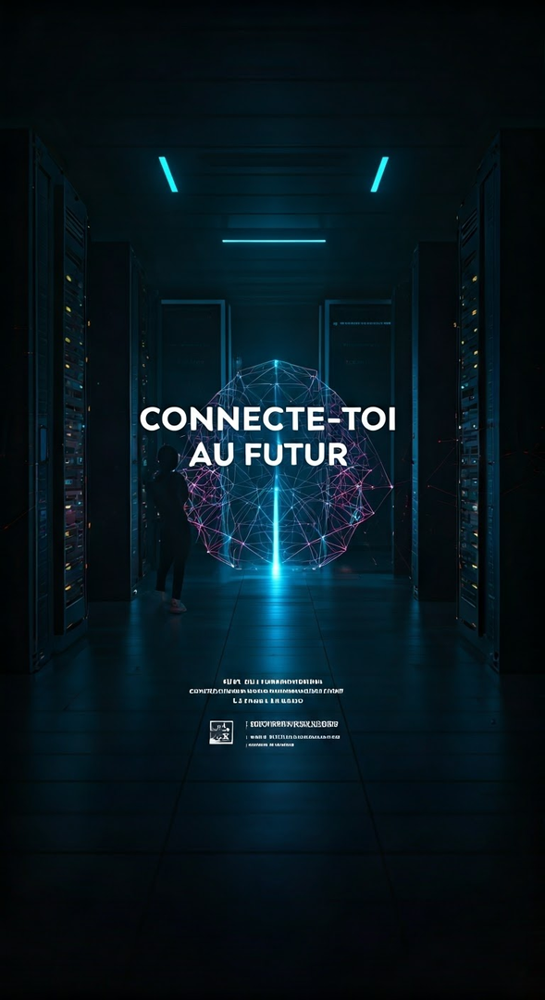

Image 3


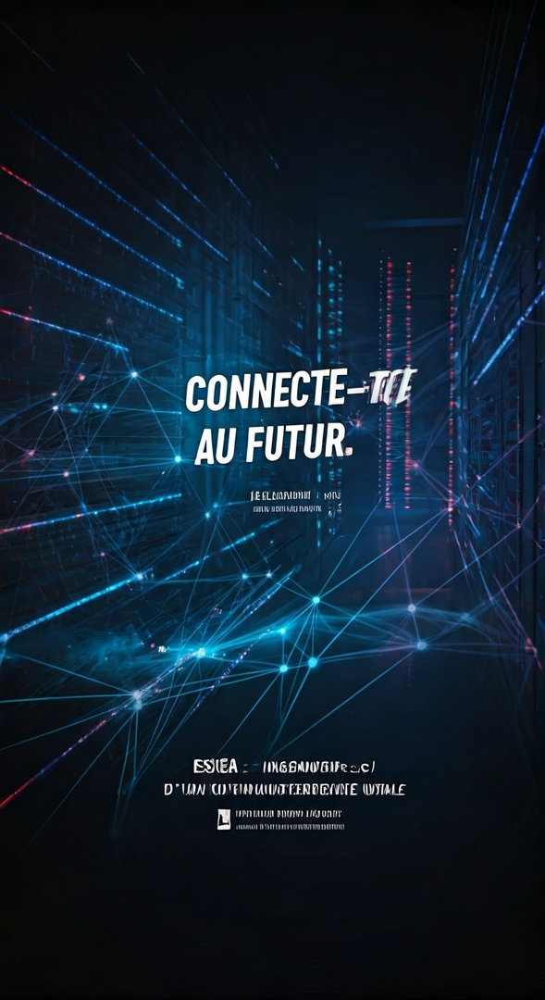

Image 4


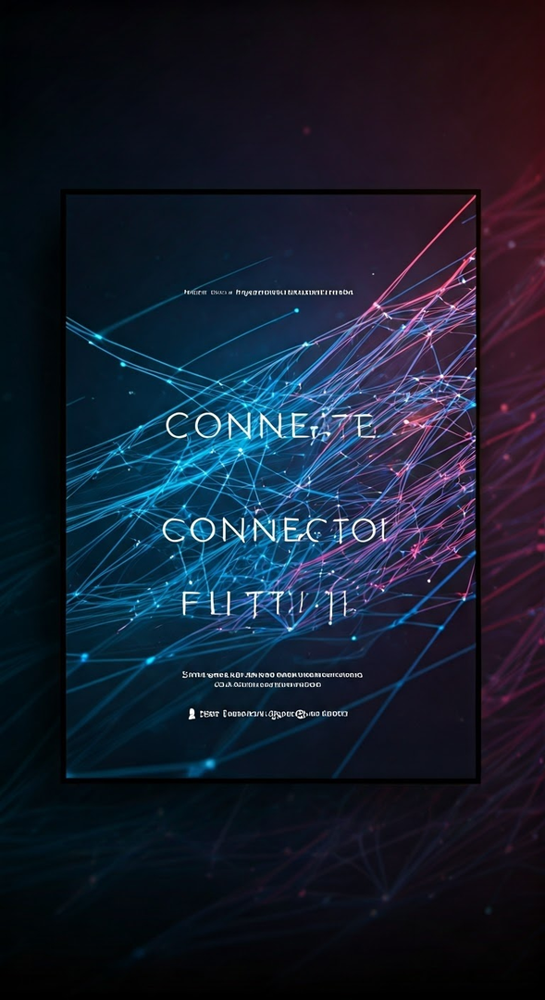

In [136]:
for index, image in enumerate(images_fast):
    print(f"Image {index+1}")
    display_images(image)
    print("=="*50)

### Affiches publicitaires en Anglais

In [130]:
prompt = """
Based on the information from the image and video (texts, dominant colors, school ranking, key messages, ambiance), \
write a prompt for Imagen3 to create an advertisement poster in English. \
The prompt should include: the main colors, important slogans or rankings, a modern and professional tone, and a visually dynamic and appealing style.
"""
prompt_for_imagen3_v2 = get_chat_response_advanced(prompt=prompt, chat_session=chat_session_advanced)

User:

Based on the information from the image and video (texts, dominant colors, school ranking, key messages, ambiance), write a prompt for Imagen3 to create an advertisement poster in English. The prompt should include: the main colors, important slogans or rankings, a modern and professional tone, and a visually dynamic and appealing style.



Chatbot:
## Imagen3 Prompt for ESIEA Advertisement Poster: "Engineer the Future"

**Objective:** Create a visually compelling advertisement poster for ESIEA, a top-ranked engineering school specializing in computer science, targeting prospective students and highlighting its excellence and strong industry connections.

**Title:** "**Engineer the Future**" in bold, large font, using a modern and technological typeface.

**Visual Style:** Dynamic and luminous, inspired by the server room ambiance in the provided image, with a play of blue and violet lighting. Incorporate visual elements symbolizing connection, networks, and cutting-edge technol

#### Imagen3

In [131]:
images = generation_model.generate_images(
    prompt=prompt_for_imagen3_v2,
    number_of_images=4, # maximum
    aspect_ratio="9:16",
)

Image 1


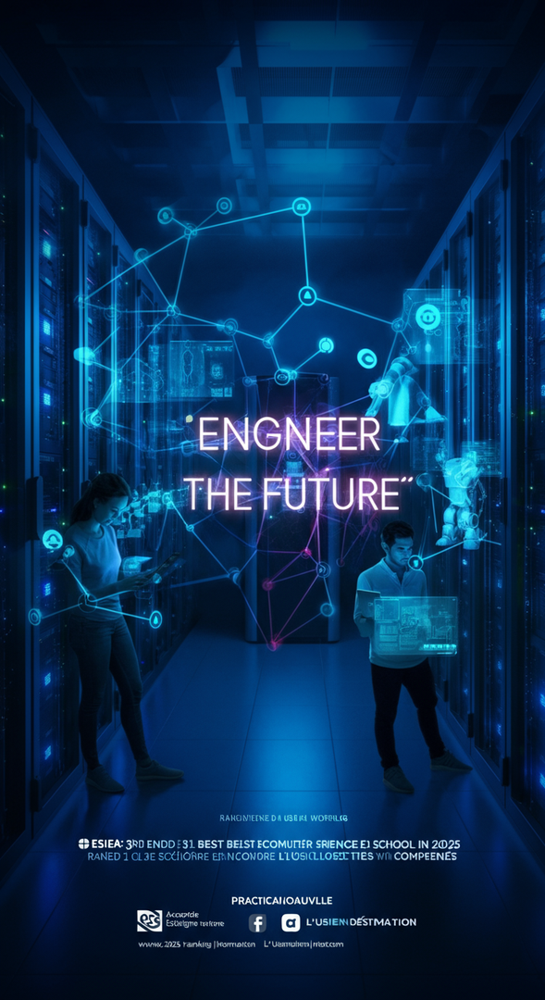

Image 2


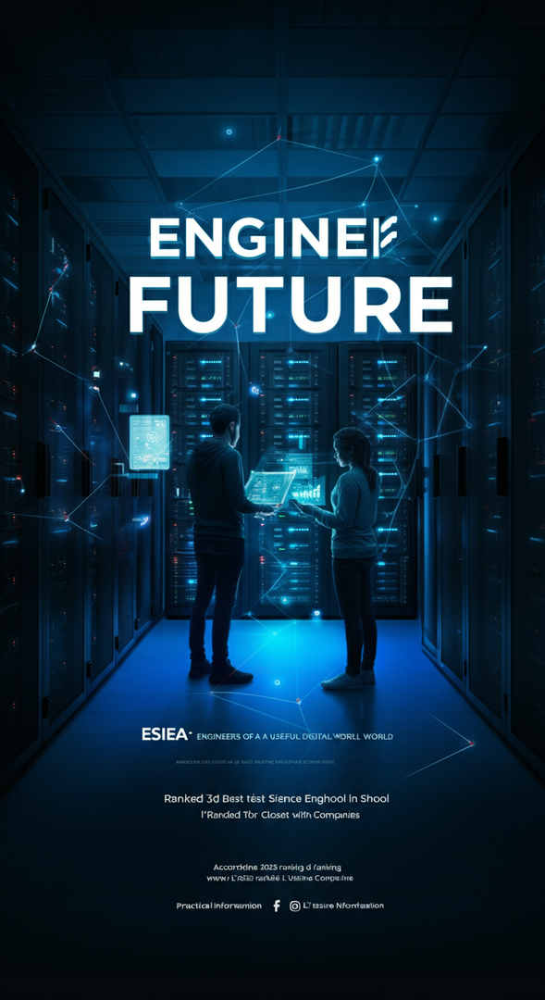

Image 3


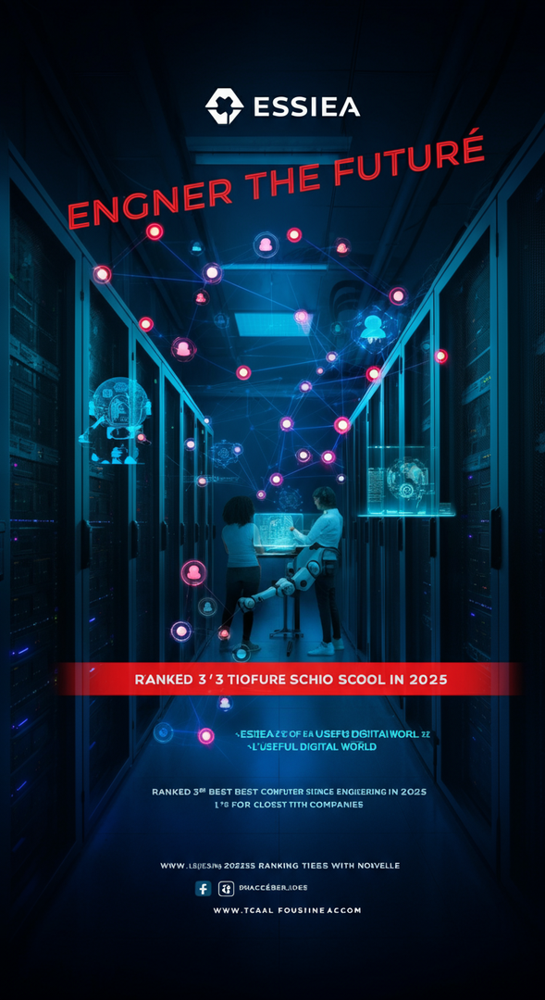

Image 4


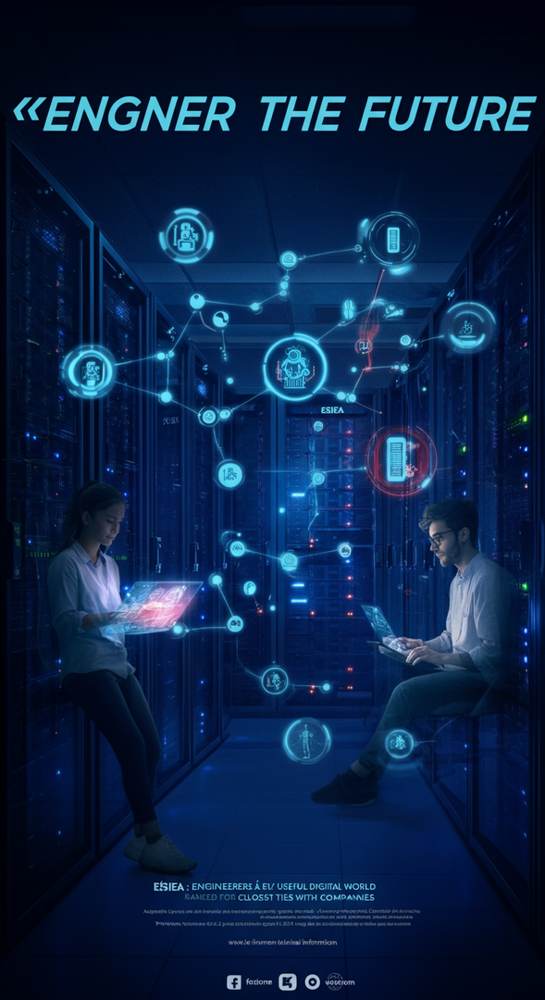

In [132]:
for index, image in enumerate(images):
    print(f"Image {index+1}")
    display_images(image)
    print("=="*50)

#### Imagen3 Fast

In [133]:
images_fast = generation_model_fast.generate_images(
    prompt=prompt_for_imagen3_v2,
    number_of_images=4, # maximum
    aspect_ratio="9:16",
)

Image 1


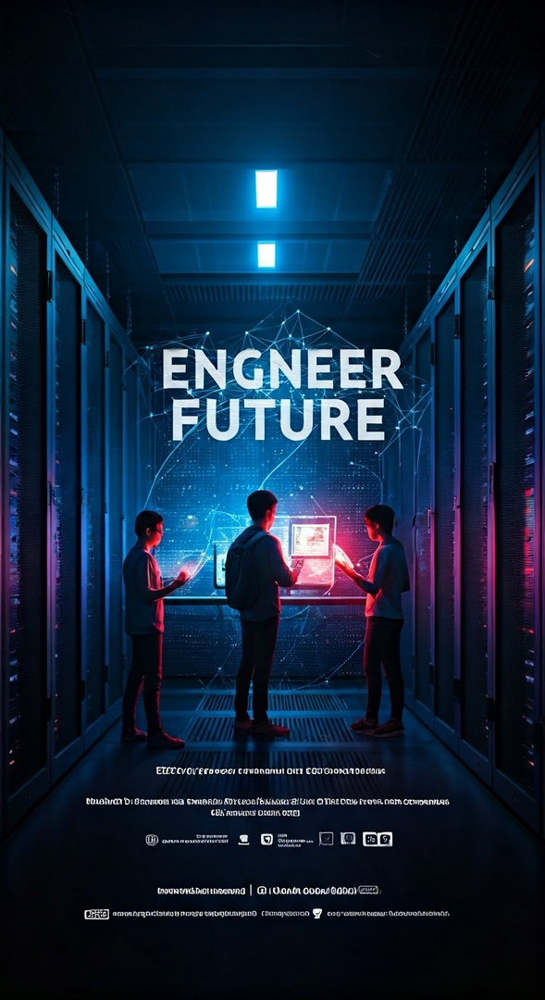

Image 2


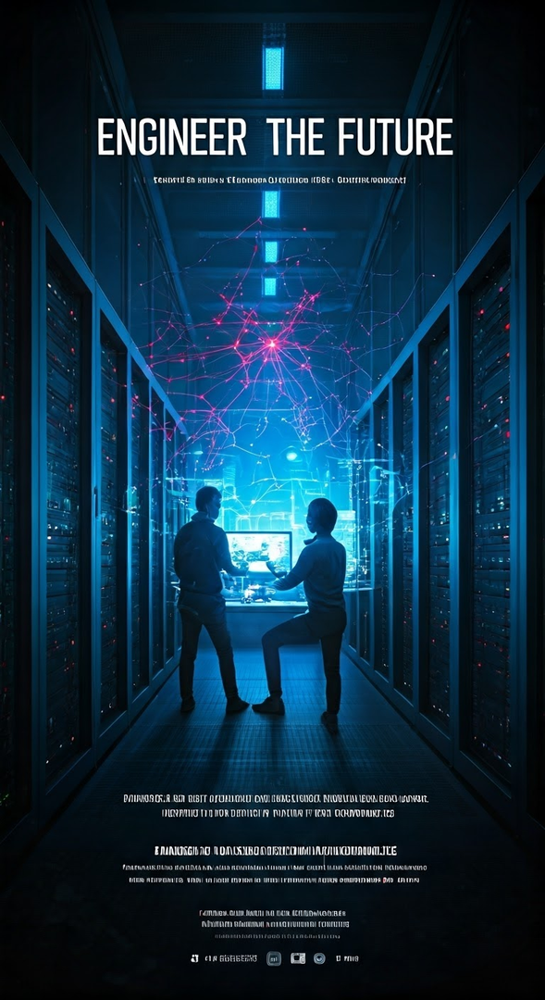

Image 3


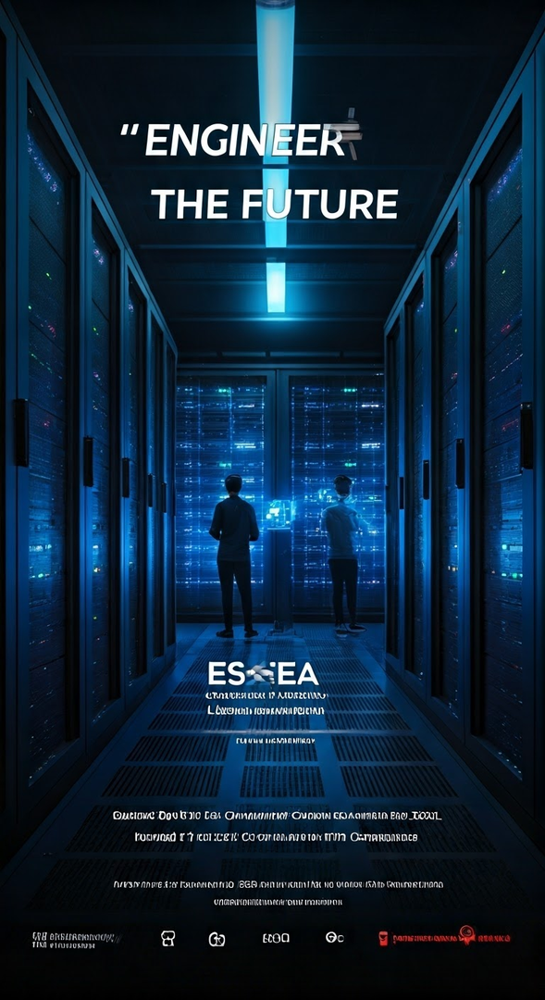

Image 4


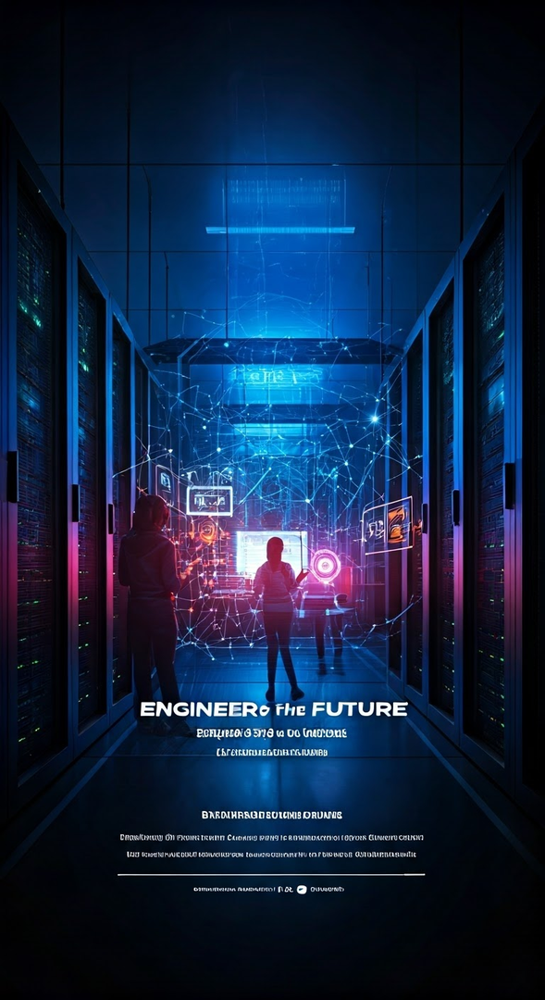

In [134]:
for index, image in enumerate(images_fast):
    print(f"Image {index+1}")
    display_images(image)
    print("=="*50)

---


## Conclusion pour la génération des images


Ici, on constate que les textes générés par les IA d'images ne sont souvent pas corrects. Cela s'explique par le fait que ces modèles sont conçus pour produire des visuels avant tout, et non pour écrire dans une langue précise. Selon moi, ils reproduisent l'apparence des lettres en imitant des formes vues dans leurs données d'entraînement, mais sans comprendre les règles grammaticales ou le sens des mots.

En outre, je trouve qu'Imagen3 produit des affiches publicitaires de meilleure qualité par rapport à Imagen3 Fast. Cela s'explique par le fait qu'Imagen3 standard prend plus de temps pour intégrer les détails et organiser les éléments visuels, ce qui rend les affiches plus informatives et mieux structurées. En revanche, Imagen3 Fast privilégie la rapidité, ce qui peut réduire la richesse et la clarté des résultats.

# Conclusion générale

Ce travail m’a permis de découvrir concrètement comment interagir avec des modèles d’intelligence artificielle en construisant des prompts adaptés à différents objectifs. J’ai appris à guider un modèle pour résumer un texte de manière claire et concise, à concevoir un chatbot capable de répondre naturellement en plusieurs langues, et à extraire des informations à partir de données multimodales, comme des images et des vidéos.

J’ai également exploré des techniques avancées de prompt engineering, ce qui m’a aidé à mieux comprendre comment formuler les instructions pour obtenir des réponses précises et pertinentes. Ce projet m’a montré l’importance de bien structurer un prompt et de tester différentes approches pour améliorer les résultats.

Au-delà de la technique, j’ai apprécié le côté créatif de ce travail, notamment en combinant les informations extraites pour produire un contenu original, comme une affiche publicitaire. Globalement, cette expérience m’a permis de renforcer mes compétences en IA tout en m’ouvrant à de nouvelles façons d’utiliser ces outils dans des contextes variés.